# Quickstart: NOAA HRRR forecast 48 hour - dynamical.org Icechunk Zarr
A brief introduction to the NOAA HRRR forecast 48 hour dataset transformed into an analysis-ready, cloud-optimized format by dynamical.org.

Dataset documentation: https://dynamical.org/catalog/noaa-hrrr-forecast-48-hour/

In [ ]:
# If running locally, follow README.md for simple dependency installation.
# If using Google Colab or SageMaker Studio Lab, run this cell and then restart the notebook.
!uv pip install -q "xarray[complete]>=2025.3.0" "zarr>=3.0.8" icechunk rioxarray pyproj
# rioxarray and pyproj are used here for working with map projections

In [2]:
import icechunk
import xarray as xr

storage = icechunk.s3_storage(bucket="dynamical-noaa-hrrr", prefix="noaa-hrrr-forecast-48-hour/v0.1.0.icechunk/", region="us-west-2", anonymous=True)
repo = icechunk.Repository.open(storage)
session = repo.readonly_session("main")
ds = xr.open_zarr(session.store, chunks=None)
ds

<xarray.Dataset> Size: 109TB
Dimensions:                                     (init_time: 11183,
                                                 lead_time: 49, y: 1059, x: 1799)
Coordinates:
    expected_forecast_length                    (init_time) timedelta64[ns] 89kB ...
    ingested_forecast_length                    (init_time) timedelta64[ns] 89kB ...
  * init_time                                   (init_time) datetime64[ns] 89kB ...
    latitude                                    (y, x) float32 8MB ...
  * lead_time                                   (lead_time) timedelta64[ns] 392B ...
    longitude                                   (y, x) float32 8MB ...
    spatial_ref                                 int64 8B ...
    valid_time                                  (init_time, lead_time) datetime64[ns] 4MB ...
  * x                                           (x) float64 14kB -2.698e+06 ....
  * y                                           (y) float64 8kB 1.587e+06 ......
Data variables: (12/26)
    categorical_freezing_rain_surface           (init_time, lead_time, y, x) float32 4TB ...
    categorical_ice_pellets_surface             (init_time, lead_time, y, x) float32 4TB ...
    categorical_rain_surface                    (init_time, lead_time, y, x) float32 4TB ...
    categorical_snow_surface                    (init_time, lead_time, y, x) float32 4TB ...
    composite_reflectivity                      (init_time, lead_time, y, x) float32 4TB ...
    dew_point_temperature_2m                    (init_time, lead_time, y, x) float32 4TB ...
    ...                                          ...
    total_cloud_cover_atmosphere                (init_time, lead_time, y, x) float32 4TB ...
    wind_gust_surface                           (init_time, lead_time, y, x) float32 4TB ...
    wind_u_10m                                  (init_time, lead_time, y, x) float32 4TB ...
    wind_u_80m                                  (init_time, lead_time, y, x) float32 4TB ...
    wind_v_10m                                  (init_time, lead_time, y, x) float32 4TB ...
    wind_v_80m                                  (init_time, lead_time, y, x) float32 4TB ...
Attributes:
    dataset_id:           noaa-hrrr-forecast-48-hour
    dataset_version:      0.1.0
    name:                 NOAA HRRR forecast, 48 hour
    description:          Weather forecasts from the High-Resolution Rapid Re...
    attribution:          NOAA NWS NCEP HRRR data processed by dynamical.org ...
    spatial_domain:       Continental United States
    spatial_resolution:   3 km
    time_domain:          Forecasts initialized 2018-07-13 12:00:00 UTC to Pr...
    time_resolution:      Forecasts initialized every 6 hours
    forecast_domain:      Forecast lead time 0-48 hours ahead
    forecast_resolution:  Hourly

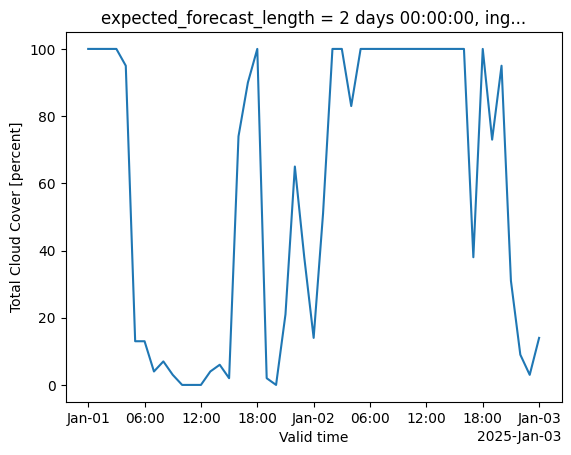

In [3]:
# Plot a forecast of cloud cover at a point
ds["total_cloud_cover_atmosphere"].sel(
    init_time="2025-01-01T00", x=0, y=0, method="nearest"
).plot(x="valid_time")

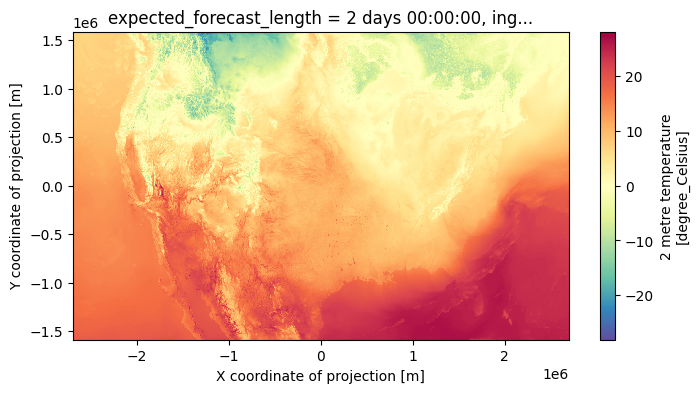

In [4]:
# Plot 2 meter air temperature from a specific forecast and lead time
(
    ds["temperature_2m"]
    .sel(init_time="2020-04-01T00", lead_time="6h")
    .plot(figsize=(8, 4), cmap="Spectral_r")
)

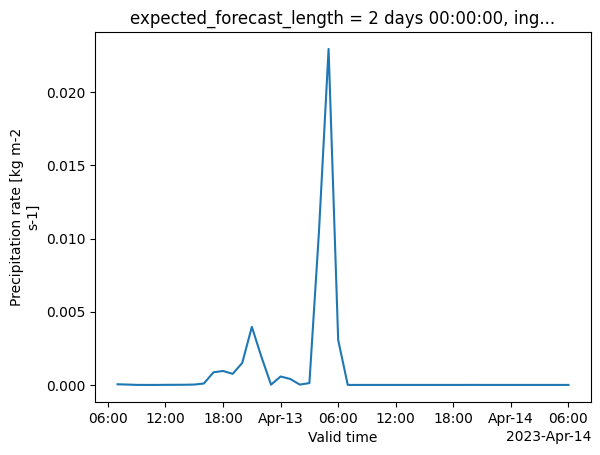

In [5]:
# HRRR data is distributed in a projected coordinate reference system and
# we include its details in the dataset metadata (e.g. ds.rio.crs, ds.rio.transform()).

# Use pyproj to transform the longitude and latitude of Fort Lauderdale, FL into dataset x, y coordinates
import rioxarray  # for .rio accessor
from pyproj import Transformer

lon_lat_to_ds = Transformer.from_crs("EPSG:4326", ds.rio.crs, always_xy=True)
x, y = lon_lat_to_ds.transform(-80.1, 26.1)

ds["precipitation_surface"].sel(
    init_time="2023-04-12T06", x=x, y=y, method="nearest"
).plot(x="valid_time")

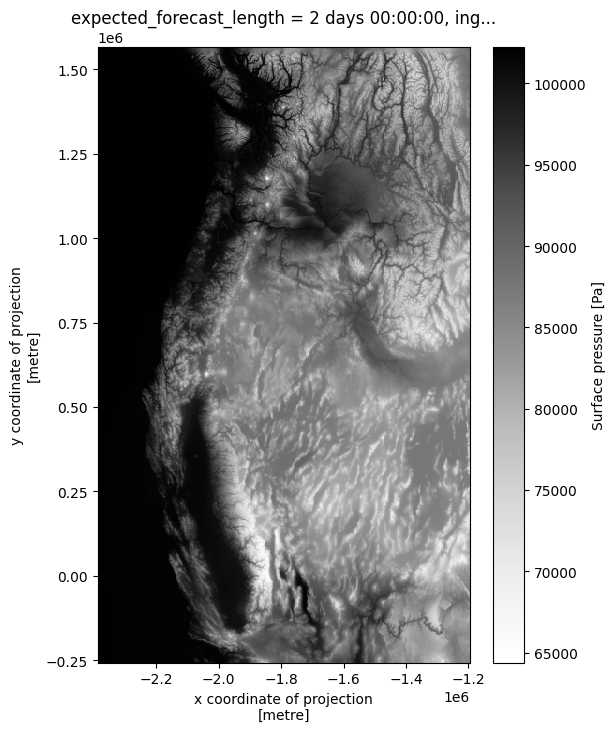

In [6]:
# Select a geographic area using (west, south, east, north) longitude/latitude coordinates
(
    ds["pressure_surface"]
    .rio.clip_box(-124, 35, -114, 50, crs="EPSG:4326")
    .sel(init_time="2025-08-01T00", lead_time="12h")
    .plot(figsize=(6, 8), cmap="Greys")
)

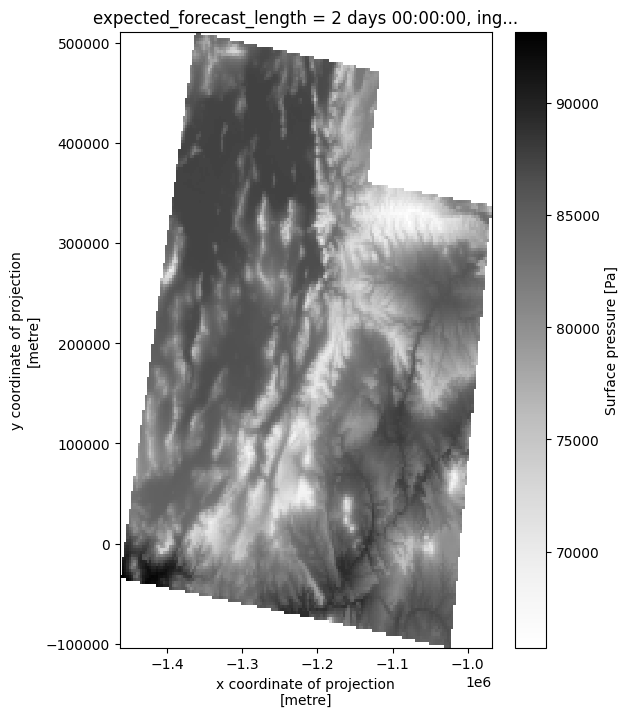

In [7]:
# Clip to geometries

# Here we use a list of one polygon that approximates the shape of the state of Utah
roughly_utah = {
    "type": "Polygon",
    "coordinates": [
        [
            [-114.04, 41.99],
            [-114.05, 37.00],
            [-109.04, 36.99],
            [-109.05, 40.99],
            [-111.04, 40.99],
            [-111.04, 42.00],
            [-114.04, 41.99],
        ]
    ],
}
geometries = [roughly_utah]

(
    ds["pressure_surface"]
    .sel(init_time="2025-08-01T00", lead_time="12h")
    # Optional: reproject to lat/lon to see vertical latitude and longitude lines
    # .rio.reproject("EPSG:4326")  
    .rio.clip(geometries, crs="EPSG:4326")
    .plot(figsize=(6, 8), cmap="Greys")
)

# To aggregate data over one or more geometries (e.g. countries, or arbitrary polygons),
# see xvec library's zonal statistics functions: https://xvec.readthedocs.io/.

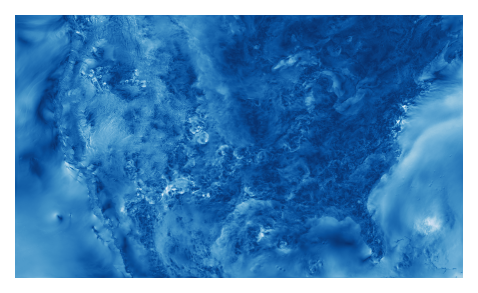

In [8]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt

# An interactive animation of a 10 meter wind speed forecast

forecast_ds = ds.sel(init_time="2025-07-09T00")
wind_speed_10m = (forecast_ds["wind_u_10m"]**2 + forecast_ds["wind_v_10m"]**2) ** 0.5
# Reduce resolution. For full resolution skip the line below and set `plt.rcParams["animation.embed_limit"] = 350 # MB`
wind_speed_10m = wind_speed_10m.coarsen(x=4, y=4, boundary="trim").mean() 
wind_speed_10m.load()

dpi=150
fig, ax = plt.subplots(figsize=(wind_speed_10m.x.size/dpi, wind_speed_10m.y.size/dpi), dpi=dpi)
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
ax.axis("off")

img = ax.imshow(wind_speed_10m.isel(lead_time=0), cmap='Blues_r')
anim = FuncAnimation(fig=fig, frames=wind_speed_10m, func=lambda frame: img.set_data(frame), interval=120)

HTML(anim.to_jshtml())